<a href="https://colab.research.google.com/github/chelseanbr/csml-final-project/blob/main/notebooks/04-colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Colab

https://colab.research.google.com/github/chelseanbr/csml-final-project/blob/main/notebooks/04-colab.ipynb

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
from google.colab import userdata
os.environ["TOKEN"] = userdata.get('TOKEN')

In [2]:
%cd /content/drive/MyDrive/csml
%pwd
%ls

/content/drive/MyDrive/csml
csml-final-project@


In [4]:
# !git clone https://$TOKEN@github.com/chelseanbr/csml-final-project.git

In [3]:
%cd csml-final-project
%pwd
%ls

/content/drive/.shortcut-targets-by-id/1Bs0GRccYBOB1gnenByQJJVmt166rOH5v/csml-final-project
data/  models/  notebooks/  README.md  report/  requirements.txt  src/


In [6]:
# !tar -xzvf data.tar.gz

In [7]:
!pip install -q -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 88.7 MB/s eta 0:00:00




---



In [4]:
!git pull

Already up to date.


In [5]:
!git status

^C


In [38]:
!git config --global user.email "chelseanbr@utexas.edu"
!git config --global user.name "Chelsea Ramos"
!git add --all
!git commit -m "update"
!git push

On branch main
Your branch is up to date with 'origin/main'.

nothing to commit, working tree clean
Everything up-to-date




---



In [ ]:
%cd ..
%ls


/Users/chelsearamos/Workspace/msai/fall25/csml/final-proj/csml-final-project
archive/          notebooks/        requirements.txt
data/             README.md         results/
data.tar.gz       report/           src/


In [9]:
import json
import pandas as pd

from PIL import Image
from src.finetune import load

/opt/anaconda3/envs/csml-proj/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
llm = load('HuggingFaceTB/SmolVLM-Instruct', 'vlm_model/SmolVLM-Instruct')

/opt/anaconda3/envs/csml-proj/lib/python3.12/site-packages/transformers/models/auto/modeling_auto.py:2242: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(
`torch_dtype` is deprecated! Use `dtype` instead!


In [ ]:
with open('data/val-grader/my_qa_pairs.json', 'r') as f:
    my_qa_pairs = json.load(f)

In [ ]:
df_val = pd.read_csv('data/val/df_val_with_iron.csv')
df_val.head(2)

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt,image_name,"Iron, Fe","Calcium, Ca","Vitamin C, total ascorbic acid"
0,https://file.b18a.io/7840587201400100529_43779...,0.8,0.9,dates,raw vegetables and fruits,['dates'],{'dates': '100g'},"{'fat_g': 0.15, 'protein_g': 2.5, 'calories_kc...",raw,20250630,7840587201400100529_437799_.jpg,1.02,39.0,0.4
1,https://file.b18a.io/7841301245100105137_12818...,0.7,0.9,rice porridge,homemade food,"['rice', 'water']","{'rice': '200g', 'water': '500ml'}","{'fat_g': 0.5, 'protein_g': 3, 'calories_kcal'...",boiling,20250702,7841301245100105137_128189_.jpg,3.54,45.0,10.8


In [ ]:
my_qa_pairs[:5]

[{'question': 'What is the general name of this dish?',
  'answer': 'dates',
  'image_file': 'val/7840587201400100529_437799_.jpg'},
 {'question': 'What category of food is this?',
  'answer': 'raw vegetables and fruits',
  'image_file': 'val/7840587201400100529_437799_.jpg'},
 {'question': 'What primary cooking method was used for this dish?',
  'answer': 'raw',
  'image_file': 'val/7840587201400100529_437799_.jpg'},
 {'question': 'What is the estimated weight of the ingredient "dates" in grams?',
  'answer': '100g',
  'image_file': 'val/7840587201400100529_437799_.jpg'},
 {'question': 'Provide a JSON object containing the calories (in kilocalories) and macronutrients (fat, protein and carbohydrates in grams) for the entire dish.',
  'answer': '{"calories_kcal":277.0,"fat_g":0.15,"protein_g":2.5,"carbs_g":75.0}',
  'image_file': 'val/7840587201400100529_437799_.jpg'}]

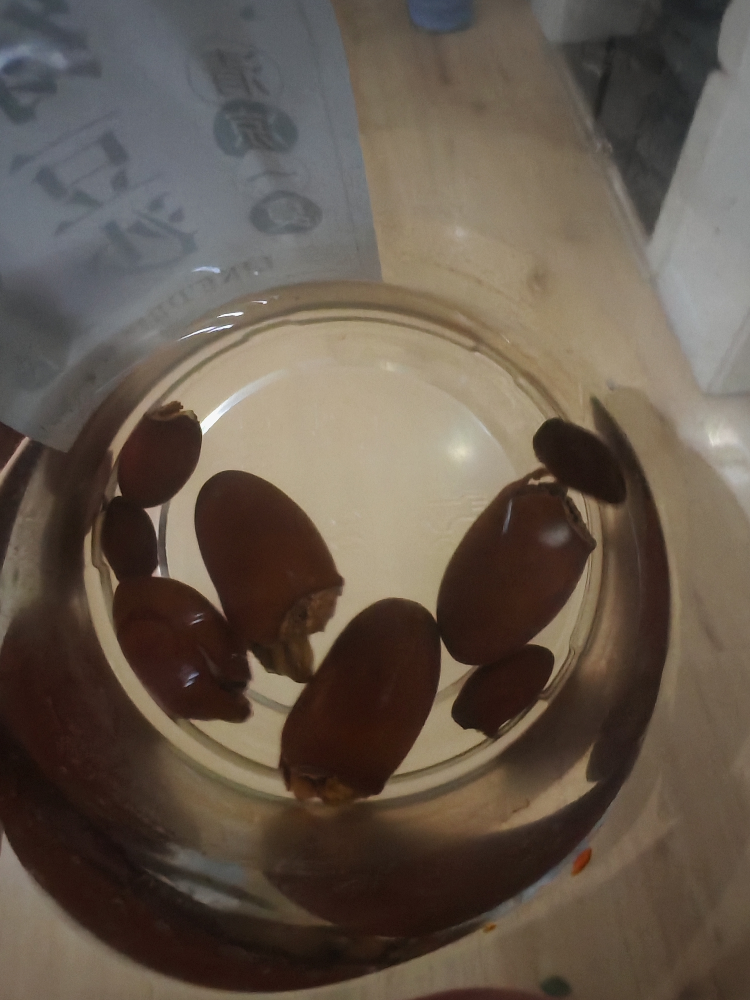

In [ ]:
image_path = f"/content/drive/MyDrive/csml/csml-final-project/data/{my_qa_pairs[i]['image_file']}"

Image.open(image_path)
prompts = ["What is the general name of this dish?",
           "What category of food is this?",
           "What primary cooking method was used for this dish?",
           "What is the estimated weight of the ingredient \"dates\" in grams?"
           "Provide a JSON object containing the calories (in kilocalories) and macronutrients (fat, protein and carbohydrates in grams) for the entire dish.",
           "Provide a JSON object containing the total weight (in grams) and micronutrients for the entire dish in milligrams."
           ]
image = [image_path] * len(prompts)
Image.open(image_path)

In [ ]:
# Ask the model
answers = llm.answer(image, prompts)

for q, a in zip(questions, answers):
  print(f"Q: {q}")
  print(f"A: {a}")

KeyboardInterrupt: 